
# FUEL CONSUMPTION PROJECT

In [1]:
# The libraries that we will need for analysis

# dataframe
import pandas as pd

# numerical python
import numpy as np

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix

# preprocessing the data
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,classification_report,confusion_matrix,accuracy_score


# models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.feature_selection import SelectKBest,f_classif

# time
import time

# metrics
from sklearn import metrics

# import KMeans
from sklearn.cluster import KMeans  


In [2]:
pd.set_option('display.max_columns',None) # help to display the maximum columns in the data records

In [3]:
# reading in the data into the notebook using pandas
df=pd.read_csv('Fuel_Consumption_Ratings_5.csv',encoding='cp1252',low_memory=False)
df.head() # inspecting the dataframe

,MODEL,MAKE,MODEL.1,VEHICLE CLASS,ENGINE SIZE,CYLINDERS,TRANSMISSION,FUEL,FUEL CONSUMPTION*,Unnamed: 9,Unnamed: 10,Unnamed: 11,CO2 EMISSIONS
0,YEAR,NaN,# = high output engine,NaN,(L),NaN,NaN,TYPE,CITY (L/100 km),HWY (L/100 km),COMB (L/100 km),COMB (mpg),(g/km)
1,2010,ACURA,CSX,COMPACT,2,4.0,AS5,X,10.9,7.8,9.5,30,219
2,2010,ACURA,CSX,COMPACT,2,4.0,M5,X,10,7.6,8.9,32,205
3,2010,ACURA,CSX,COMPACT,2,4.0,M6,Z,11.6,8.1,10,28,230
4,2010,ACURA,MDX AWD,SUV,3.7,6.0,AS6,Z,14.8,11.3,13.2,21,304


In [4]:
# from the data inspection we notice that the index 0  , contains some of the columns in the data
# hence we will rearrange the columns

In [5]:
df=df[1:5360] # takes the data less the row header till the end of the records 
df # inspect the data

,MODEL,MAKE,MODEL.1,VEHICLE CLASS,ENGINE SIZE,CYLINDERS,TRANSMISSION,FUEL,FUEL CONSUMPTION*,Unnamed: 9,Unnamed: 10,Unnamed: 11,CO2 EMISSIONS
1,2010,ACURA,CSX,COMPACT,2,4.0,AS5,X,10.9,7.8,9.5,30,219
2,2010,ACURA,CSX,COMPACT,2,4.0,M5,X,10,7.6,8.9,32,205
3,2010,ACURA,CSX,COMPACT,2,4.0,M6,Z,11.6,8.1,10,28,230
4,2010,ACURA,MDX AWD,SUV,3.7,6.0,AS6,Z,14.8,11.3,13.2,21,304
5,2010,ACURA,RDX AWD TURBO,SUV,2.3,4.0,AS5,Z,13.2,10.3,11.9,24,274
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5355,2014,VOLVO,XC60 AWD,SUV - SMALL,3,6.0,AS6,X,13.4,9.8,11.8,24,271
5356,2014,VOLVO,XC60 AWD,SUV - SMALL,3.2,6.0,AS6,X,13.2,9.5,11.5,25,264
5357,2014,VOLVO,XC70 AWD,SUV - SMALL,3,6.0,AS6,X,13.4,9.8,11.8,24,271
5358,2014,VOLVO,XC70 AWD,SUV - SMALL,3.2,6.0,AS6,X,12.9,9.3,11.3,25,260


In [6]:
# next we will need to rename some of the columns  
df = df.rename({'MODEL':'MODEL YEAR','MODEL.1':'MODEL','FUEL CONSUMPTION*':'FUEL CONSUMPTION CITY (L/100 km)',
                'Unnamed: 9': 'FUEL CONSUMPTION HWY (L/100 km)','Unnamed: 10': 'FUEL CONSUMPTION COMB (L/100 km)',
                'Unnamed: 11':'FUEL CONSUMPTION COMB (mpg)'},axis=1)  # new renamed column headers

In [7]:
# now that we have renamed the columns, next we filter the specific columns needed for analysis
df=df[['MODEL YEAR','MAKE','MODEL','VEHICLE CLASS','ENGINE SIZE','CYLINDERS','TRANSMISSION','FUEL',
       'FUEL CONSUMPTION CITY (L/100 km)','FUEL CONSUMPTION HWY (L/100 km)','FUEL CONSUMPTION COMB (L/100 km)',
       'FUEL CONSUMPTION COMB (mpg)','CO2 EMISSIONS ']]

In [8]:
df # Inspecting the new dataframe

,MODEL YEAR,MAKE,MODEL,VEHICLE CLASS,ENGINE SIZE,CYLINDERS,TRANSMISSION,FUEL,FUEL CONSUMPTION CITY (L/100 km),FUEL CONSUMPTION HWY (L/100 km),FUEL CONSUMPTION COMB (L/100 km),FUEL CONSUMPTION COMB (mpg),CO2 EMISSIONS
1,2010,ACURA,CSX,COMPACT,2,4.0,AS5,X,10.9,7.8,9.5,30,219
2,2010,ACURA,CSX,COMPACT,2,4.0,M5,X,10,7.6,8.9,32,205
3,2010,ACURA,CSX,COMPACT,2,4.0,M6,Z,11.6,8.1,10,28,230
4,2010,ACURA,MDX AWD,SUV,3.7,6.0,AS6,Z,14.8,11.3,13.2,21,304
5,2010,ACURA,RDX AWD TURBO,SUV,2.3,4.0,AS5,Z,13.2,10.3,11.9,24,274
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5355,2014,VOLVO,XC60 AWD,SUV - SMALL,3,6.0,AS6,X,13.4,9.8,11.8,24,271
5356,2014,VOLVO,XC60 AWD,SUV - SMALL,3.2,6.0,AS6,X,13.2,9.5,11.5,25,264
5357,2014,VOLVO,XC70 AWD,SUV - SMALL,3,6.0,AS6,X,13.4,9.8,11.8,24,271
5358,2014,VOLVO,XC70 AWD,SUV - SMALL,3.2,6.0,AS6,X,12.9,9.3,11.3,25,260


# Data Cleaning

In [9]:
df.info() # using the info method to know the number of data entries, the data types and also null entries present

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5359 entries, 1 to 5359
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   MODEL YEAR                        5359 non-null   object 
 1   MAKE                              5359 non-null   object 
 2   MODEL                             5359 non-null   object 
 3   VEHICLE CLASS                     5359 non-null   object 
 4   ENGINE SIZE                       5359 non-null   object 
 5   CYLINDERS                         5359 non-null   float64
 6   TRANSMISSION                      5359 non-null   object 
 7   FUEL                              5359 non-null   object 
 8   FUEL CONSUMPTION CITY (L/100 km)  5359 non-null   object 
 9   FUEL CONSUMPTION HWY (L/100 km)   5359 non-null   object 
 10  FUEL CONSUMPTION COMB (L/100 km)  5359 non-null   object 
 11  FUEL CONSUMPTION COMB (mpg)       5359 non-null   object 
 12  CO2 EM

In [10]:
#from the above we notice that there are 5359 records, and also each column has 5359. therefore there is no null values.

In [11]:
# Function for changing the object data types type to float

In [12]:
# we also notice that the Engine size, fuel, fuel consumption are all an object type, hence we will change them to float

def DATATYPE(df):
    # changes the model year to integers
    df['MODEL YEAR']=df['MODEL YEAR'].astype('float')
    df['MODEL YEAR']=df['MODEL YEAR'].astype('int32')
    
    # changes the datatype of engines from object to float
    df['ENGINE SIZE']=df['ENGINE SIZE'].astype('float')
    
    # change fuel consumption at l/100 km to float
    df['FUEL CONSUMPTION CITY (L/100 km)']=df['FUEL CONSUMPTION CITY (L/100 km)'].astype('float')
    
    # changes HWY (L/100 km) to float
    df['FUEL CONSUMPTION HWY (L/100 km)']=df['FUEL CONSUMPTION HWY (L/100 km)'].astype('float')
    
    # changes COMB (L/100 km) to float
    df['FUEL CONSUMPTION COMB (L/100 km)']=df['FUEL CONSUMPTION COMB (L/100 km)'].astype('float')
    
    # change COMB(mpg) to int 
    df['FUEL CONSUMPTION COMB (mpg)']=df['FUEL CONSUMPTION COMB (mpg)'].astype('float')
    df['FUEL CONSUMPTION COMB (mpg)']=df['FUEL CONSUMPTION COMB (mpg)'].astype('int32')
    
    # changes CO2 emission to float data type
    df['CO2 EMISSIONS ']=df['CO2 EMISSIONS '].astype('float')
    df['CO2 EMISSIONS ']=df['CO2 EMISSIONS '].astype('int32')


In [13]:
DATATYPE(df) # calling the function definition
df.info() # inspecting it

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5359 entries, 1 to 5359
Data columns (total 13 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   MODEL YEAR                        5359 non-null   int32  
 1   MAKE                              5359 non-null   object 
 2   MODEL                             5359 non-null   object 
 3   VEHICLE CLASS                     5359 non-null   object 
 4   ENGINE SIZE                       5359 non-null   float64
 5   CYLINDERS                         5359 non-null   float64
 6   TRANSMISSION                      5359 non-null   object 
 7   FUEL                              5359 non-null   object 
 8   FUEL CONSUMPTION CITY (L/100 km)  5359 non-null   float64
 9   FUEL CONSUMPTION HWY (L/100 km)   5359 non-null   float64
 10  FUEL CONSUMPTION COMB (L/100 km)  5359 non-null   float64
 11  FUEL CONSUMPTION COMB (mpg)       5359 non-null   int32  
 12  CO2 EM

In [14]:
# now that our data is clean , we will now proceed to inspect for duplicates

In [15]:
df.duplicated().sum() # inspecting to see if there are duplicates in the dataset

0

In [16]:
# we can observe that there are no duplicates presence, hence we proceed to perform exploratory data analysis

# Exploratory Data Analysis

<Figure size 2500x2000 with 0 Axes>

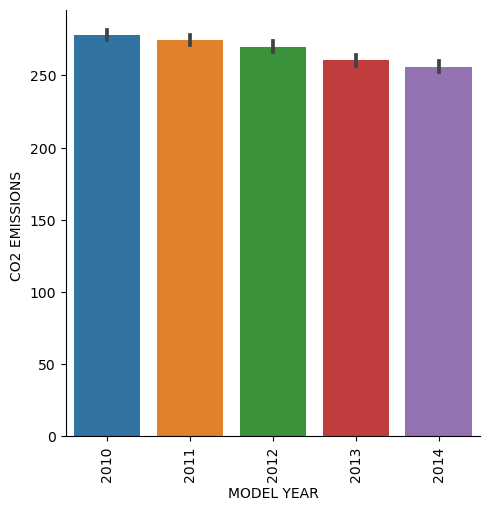

In [17]:
Vehicle_Make = df[['MODEL YEAR','CO2 EMISSIONS ']] # filters the model year and C02 prediction
plt.figure(figsize = (25,20)) # plots the size
sns.catplot(x = 'MODEL YEAR', y ='CO2 EMISSIONS ',data=Vehicle_Make,kind='bar') # plot on the model against the year
plt.xticks(rotation = 90, fontsize = 10)
plt.show()

looking at the year 2010 to 2014, thought there is a slight reduction of CO2 emission , but the reduction isn't significant

<Figure size 2500x2000 with 0 Axes>

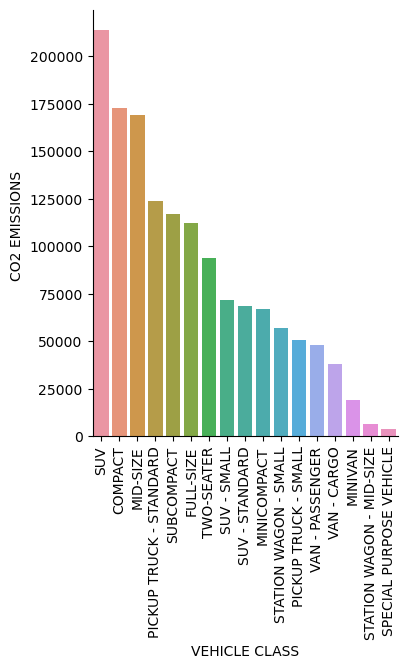

In [18]:
# let now have a look at the Categorical attributes

Vehicle_class = df[['VEHICLE CLASS','CO2 EMISSIONS ']]
Vehicle_class = Vehicle_class.groupby('VEHICLE CLASS').sum().sort_values(by ='CO2 EMISSIONS ',
                                                                         ascending = False).reset_index()
plt.figure(figsize = (25,20))
sns.catplot(x = 'VEHICLE CLASS', y ='CO2 EMISSIONS ',data=Vehicle_class,kind='bar')
plt.xticks(rotation = 90, fontsize = 10)
plt.show()

SUV, COMPACT and MID-Size vehicle have a high class of emission of CO2

<Figure size 2500x2000 with 0 Axes>

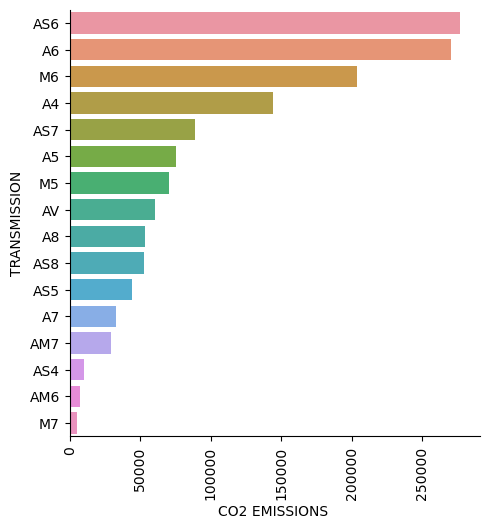

In [19]:
# transmission and the CO2 that they emit
Transmission_df = df[['TRANSMISSION','CO2 EMISSIONS ']]
Transmission_df = Transmission_df.groupby('TRANSMISSION').sum().sort_values(by ='CO2 EMISSIONS ',
                                                                         ascending = False)[:16].reset_index()
plt.figure(figsize = (25,20))
sns.catplot(y = 'TRANSMISSION', x ='CO2 EMISSIONS ',data=Transmission_df,kind='bar')
plt.xticks(rotation = 90, fontsize = 10)
plt.show()

we can see clearly that AS6 AND A6 have higher transmissions while the ones of M7 and AM6 have lower transmissions

<Figure size 2500x2000 with 0 Axes>

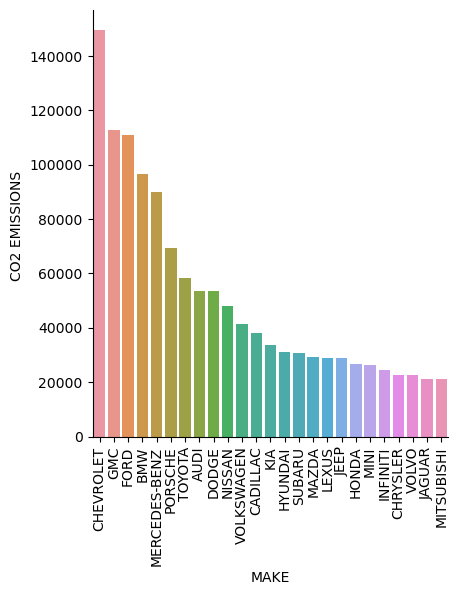

In [20]:
# plot of the vehicles make and the CO2 that they emit
Vehicle_make = df[['MAKE','CO2 EMISSIONS ']]
Vehicle_make = Vehicle_make .groupby('MAKE').sum().sort_values(by ='CO2 EMISSIONS ',
                                                                         ascending = False)[:25].reset_index()
plt.figure(figsize = (25,20))
sns.catplot(x = 'MAKE', y ='CO2 EMISSIONS ',data=Vehicle_make ,kind='bar')
plt.xticks(rotation = 90, fontsize = 10)
plt.show()

The vehicle manufactures of Chevrolet, GMC , Ford and BMW are the major manufactures in which the cars they produce emits a high emission of C02 , when compared the volvo jaguar and mitsubishi their emission is low.

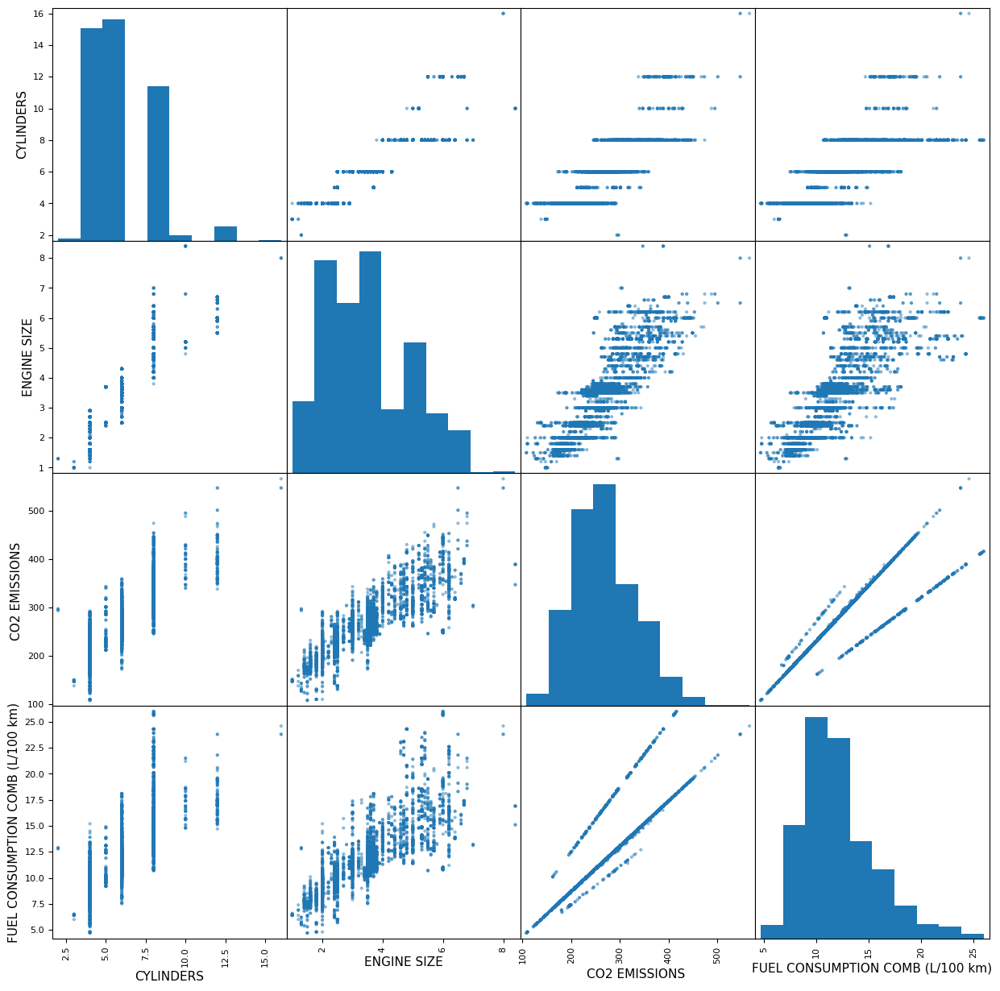

In [21]:
# visualization 
plt.rc('font', size=11)
scatter_matrix(df[['CYLINDERS','ENGINE SIZE','CO2 EMISSIONS ','FUEL CONSUMPTION COMB (L/100 km)']], figsize=(15, 15))
plt.tight_layout;
plt.show()

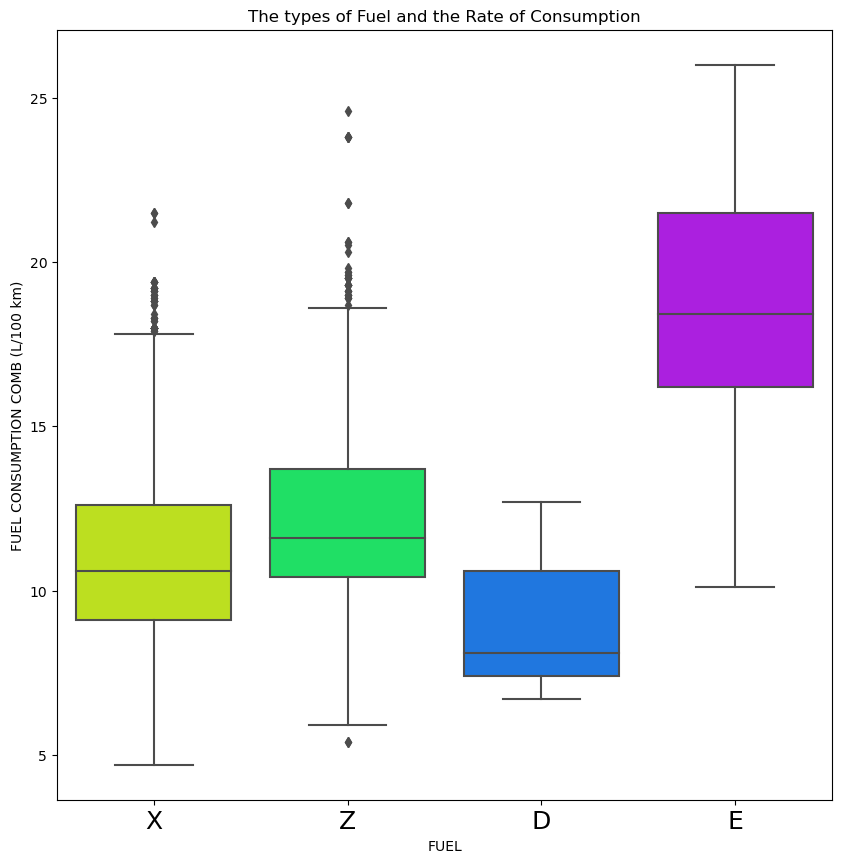

In [22]:
plt.figure(figsize=(10,10))
plt.rc('font', size=10) #sets the font size to 15
plt.xticks(rotation=0, size = 18)
sns.boxplot(x=df['FUEL'],  y=df['FUEL CONSUMPTION COMB (L/100 km)'], palette = 'hsv', 
            meanprops={"marker":"o", "markerfacecolor":"Red", "markeredgecolor":"black","markersize":"10"})
plt.title ("The types of Fuel and the Rate of Consumption");

# Using the numerical continuous variables in the dataset provided to build a model to predict the CO2 emission

In [23]:
Numeric_data = df.select_dtypes(include=np.number).reset_index() # contains only numeric continuous data
Numeric_data.drop(Numeric_data[['index']], axis = 1, inplace = True)
Numeric_data.head() # displays the first five rows

,MODEL YEAR,ENGINE SIZE,CYLINDERS,FUEL CONSUMPTION CITY (L/100 km),FUEL CONSUMPTION HWY (L/100 km),FUEL CONSUMPTION COMB (L/100 km),FUEL CONSUMPTION COMB (mpg),CO2 EMISSIONS
0,2010,2.0,4.0,10.9,7.8,9.5,30,219
1,2010,2.0,4.0,10.0,7.6,8.9,32,205
2,2010,2.0,4.0,11.6,8.1,10.0,28,230
3,2010,3.7,6.0,14.8,11.3,13.2,21,304
4,2010,2.3,4.0,13.2,10.3,11.9,24,274


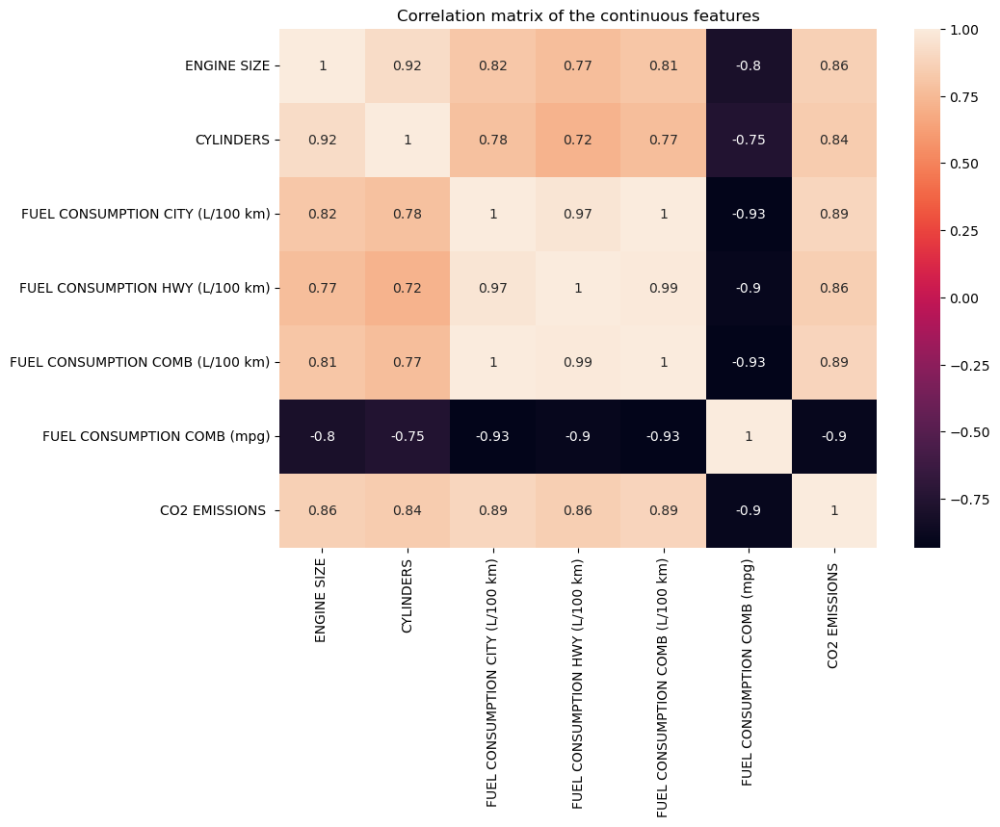

In [24]:
# correlation of the continous numerical variables
Numeric_data.drop(Numeric_data[['MODEL YEAR']],axis=1,inplace=True) # dropping the model year
plt.figure(figsize=(10,7))
sns.heatmap(Numeric_data.corr(),annot=True)
plt.title('Correlation matrix of the continuous features')
plt.show()

In [25]:
# from the heatmap , we will use all the continous variable to make prediction apart from fuel consumption COMB (mpg)
# because it is negatively correlated.

# Machine Learning Model

The machine learning model that will be used are Linear regression, Adaboost regressor model and Gradientbooting Regression Model

# Linear Regression Model

we will drop fuel consumption COMB (mpg) because it is negatively correlated.

In [26]:
x=Numeric_data.drop(['FUEL CONSUMPTION COMB (mpg)','CO2 EMISSIONS '], axis=1) # features except CO2 & Fuel CONSUMP.
y=Numeric_data['CO2 EMISSIONS '] # the target

In [27]:
# spliting the data into training and testing 
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

now that we are done splitting the data into train and test dataset, we will proceed to scale the data inorder to makes it easy for a model to learn and understand the problem

In [28]:
sc = MinMaxScaler() # to scale the data
x_train_sc = sc.fit_transform(x_train)
x_test_sc = sc.transform(x_test)

In [29]:
#converting the data to a pandas dataframe
x_train_sc = pd.DataFrame(x_train_sc, columns = x_train.columns)
x_test_sc = pd.DataFrame(x_test_sc, columns = x_test.columns)

In [30]:
# Reshaping the attribute
X_train_sc=x_train_sc.to_numpy().reshape(-1,1)
X_test_sc = x_test_sc.to_numpy().reshape(-1,1)

In [31]:
reg = LinearRegression() # regression model

In [32]:
# The model 
def reg_model(model):
    model.fit(x_train_sc,y_train)
    preds = model.predict(x_test_sc) 
    mean_abs = mean_absolute_error(y_test,preds)
    mean_squared = mean_squared_error(y_test,preds)
    print(f"mean_absolute_error is: {mean_abs:.2f}")
    print(f"root mean squared error is : {np.sqrt(mean_squared):.2f}")
    print(f"coefficient of determination is: {r2_score(y_test,preds):.2f}")
    print(f"Training accuracy score: {model.score(x_train_sc,y_train):.4f}")
    print(f"Testing accuracy score: {model.score(x_test_sc,y_test):.4f}")

    
reg_model(reg)

mean_absolute_error is: 18.05
root mean squared error is : 24.58
coefficient of determination is: 0.85
Training accuracy score: 0.8539
Testing accuracy score: 0.8530


# AdaBoost Regressor Model

In [33]:
AdaBoostModel = AdaBoostRegressor() # adaboost model

In [34]:
# The model test report
def Adaboost_model(model):
    model.fit(x_train_sc,y_train)
    preds = model.predict(x_test_sc) 
    mean_abs = mean_absolute_error(y_test,preds)
    mean_squared = mean_squared_error(y_test,preds)
    print(f"mean_absolute_error is: {mean_abs:.2f}")
    print(f"root mean squared error is : {np.sqrt(mean_squared):.2f}")
    print(f"coefficient of determination is: {r2_score(y_test,preds):.2f}")
    print(f"Training accuracy score: {model.score(x_train_sc,y_train):.4f}")
    print(f"Testing accuracy score: {model.score(x_test_sc,y_test):.4f}")
    
    
Adaboost_model(AdaBoostModel)

mean_absolute_error is: 12.58
root mean squared error is : 18.37
coefficient of determination is: 0.92
Training accuracy score: 0.9138
Testing accuracy score: 0.9179


# Gradientbooting Regression Model

In [35]:
GradientModel=GradientBoostingRegressor() # gradientboosting regressor

In [36]:
# The model test report
def Gradientbooting(model):
    model.fit(x_train_sc,y_train)
    preds = model.predict(x_test_sc) 
    mean_abs = mean_absolute_error(y_test,preds)
    mean_squared = mean_squared_error(y_test,preds)
    print(f"mean_absolute_error is: {mean_abs:.2f}")
    print(f"root mean squared error is : {np.sqrt(mean_squared):.2f}")
    print(f"coefficient of determination is: {r2_score(y_test,preds):.2f}")
    print(f"Training accuracy score: {model.score(x_train_sc,y_train):.4f}")
    print(f"Testing accuracy score: {model.score(x_test_sc,y_test):.4f}")

    
Gradientbooting(AdaBoostModel)

mean_absolute_error is: 13.19
root mean squared error is : 18.79
coefficient of determination is: 0.91
Training accuracy score: 0.9104
Testing accuracy score: 0.9141


# Using each categorical variable as the target variable at each instance, determine which of the variables performed best in classifying the dataset. Explain your findings.

In [37]:
# this contains the categorical variables

In [38]:
object_data = df.select_dtypes(exclude=np.number).reset_index() # contains only categorical data
object_data.drop(object_data[['index']], axis = 1, inplace = True)
object_data.head() # displays the first five rows

,MAKE,MODEL,VEHICLE CLASS,TRANSMISSION,FUEL
0,ACURA,CSX,COMPACT,AS5,X
1,ACURA,CSX,COMPACT,M5,X
2,ACURA,CSX,COMPACT,M6,Z
3,ACURA,MDX AWD,SUV,AS6,Z
4,ACURA,RDX AWD TURBO,SUV,AS5,Z


In [39]:
le=LabelEncoder()

In [40]:
# uses label encoded to change each categorical variable
make_encoded=le.fit_transform(object_data['MAKE'])
model_encoded=le.fit_transform(object_data['MODEL'])
Vehicle_encoded=le.fit_transform(object_data['VEHICLE CLASS'])
Transmission_encoded=le.fit_transform(object_data['TRANSMISSION'])
fuel_encoded=le.fit_transform(object_data['FUEL'])

# putting the columns in a dataframe
df_make=pd.DataFrame(make_encoded,columns=['MAKE'])
df_model=pd.DataFrame(model_encoded,columns=['MODEL'])
df_Vehicle=pd.DataFrame(Vehicle_encoded,columns=['VEHICLE CLASS'])
df_Transmission=pd.DataFrame(Transmission_encoded,columns=['TRANSMISSION'])
df_fuel=pd.DataFrame(fuel_encoded,columns=['FUEL'])

# concatenating the different dataframe
data=pd.concat([df_make,df_model,df_Vehicle,df_Transmission,df_fuel,df['CO2 EMISSIONS '].reset_index()],axis=1).reset_index()
data=data[['MAKE','MODEL','VEHICLE CLASS','TRANSMISSION','FUEL','CO2 EMISSIONS ']]
data

,MAKE,MODEL,VEHICLE CLASS,TRANSMISSION,FUEL,CO2 EMISSIONS
0,0,352,0,10,2,219
1,0,352,0,19,2,205
2,0,352,0,20,3,230
3,0,734,11,11,3,304
4,0,884,11,10,3,274
...,...,...,...,...,...,...
5354,44,1138,12,11,2,271
5355,44,1138,12,11,2,264
5356,44,1142,12,11,2,271
5357,44,1142,12,11,2,260


In [41]:
x=data.drop('CO2 EMISSIONS ',axis=1) # features
y=data['CO2 EMISSIONS '] # target

In [42]:
# spliting the data into training and testing 
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

<AxesSubplot:>

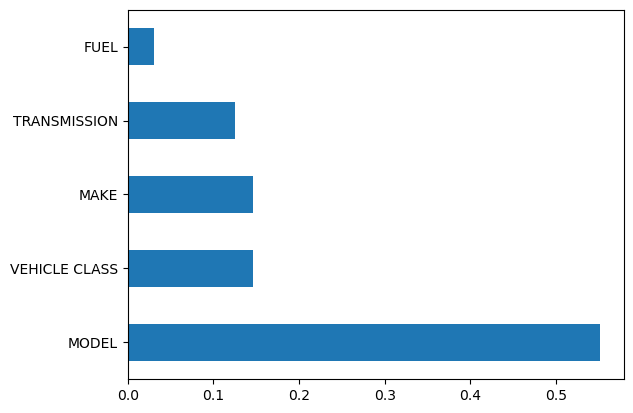

In [43]:
from sklearn.ensemble import RandomForestClassifier

X=data.drop('CO2 EMISSIONS ',axis=1)
y=data['CO2 EMISSIONS ']
model = RandomForestClassifier()
model.fit(X, y)

(pd.Series(model.feature_importances_, index=X.columns).nlargest(5).plot(kind='barh'))  

In [44]:
# from the feature importance we can see that the categorical feauture that have high importance to CO2 predictive is the Model

In [47]:
sc= MinMaxScaler() # standardized the data

In [48]:
Scaled_df=sc.fit_transform(Numeric_data)

In [49]:
Scaled_df # inspecting the scaled dataframe

array([[0.13513514, 0.14285714, 0.24710425, ..., 0.22535211, 0.3877551 ,
        0.24235808],
       [0.13513514, 0.14285714, 0.21235521, ..., 0.1971831 , 0.42857143,
        0.21179039],
       [0.13513514, 0.14285714, 0.27413127, ..., 0.24882629, 0.34693878,
        0.26637555],
       ...,
       [0.27027027, 0.28571429, 0.34362934, ..., 0.33333333, 0.26530612,
        0.3558952 ],
       [0.2972973 , 0.28571429, 0.32432432, ..., 0.30985915, 0.28571429,
        0.33187773],
       [0.2972973 , 0.28571429, 0.4015444 , ..., 0.38028169, 0.2244898 ,
        0.40611354]])

In [50]:
# now we will use KMEANS clusterring

In [51]:
Kmeans_Model = KMeans(n_clusters=7) # clustering into 7 numbers

In [52]:
ClusterLabels = Kmeans_Model.fit_predict(Scaled_df) # fiting my model to learn better

In [53]:
ClusterLabels

array([6, 6, 6, ..., 0, 0, 0])

In [54]:
Numeric_data['Cluster'] = ClusterLabels

In [55]:
Numeric_data

,ENGINE SIZE,CYLINDERS,FUEL CONSUMPTION CITY (L/100 km),FUEL CONSUMPTION HWY (L/100 km),FUEL CONSUMPTION COMB (L/100 km),FUEL CONSUMPTION COMB (mpg),CO2 EMISSIONS,Cluster
0,2.0,4.0,10.9,7.8,9.5,30,219,6
1,2.0,4.0,10.0,7.6,8.9,32,205,6
2,2.0,4.0,11.6,8.1,10.0,28,230,6
3,3.7,6.0,14.8,11.3,13.2,21,304,5
4,2.3,4.0,13.2,10.3,11.9,24,274,0
...,...,...,...,...,...,...,...,...
5354,3.0,6.0,13.4,9.8,11.8,24,271,0
5355,3.2,6.0,13.2,9.5,11.5,25,264,0
5356,3.0,6.0,13.4,9.8,11.8,24,271,0
5357,3.2,6.0,12.9,9.3,11.3,25,260,0


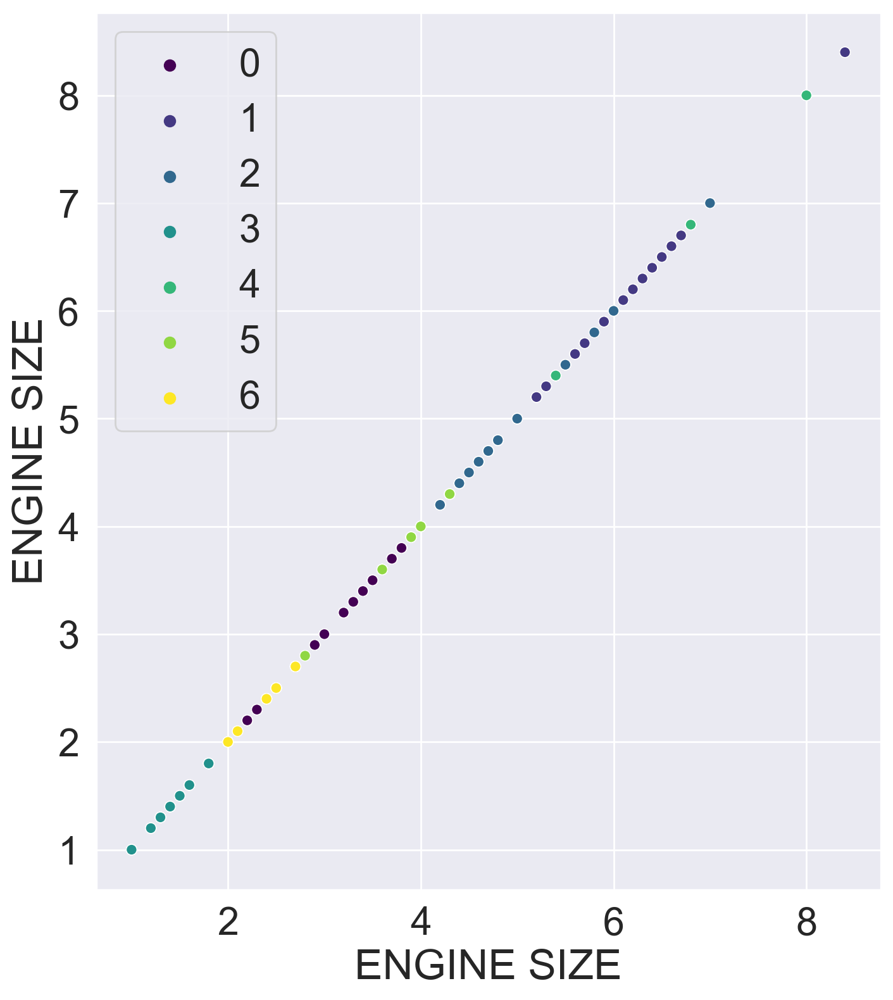

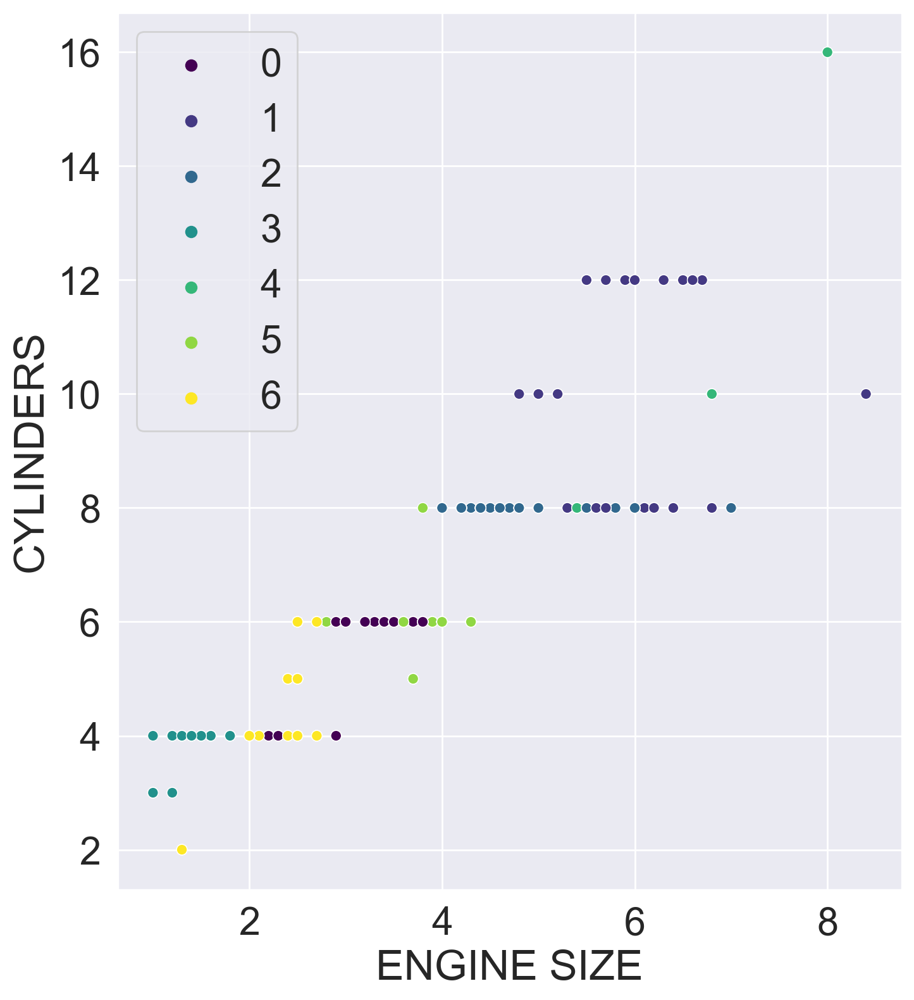

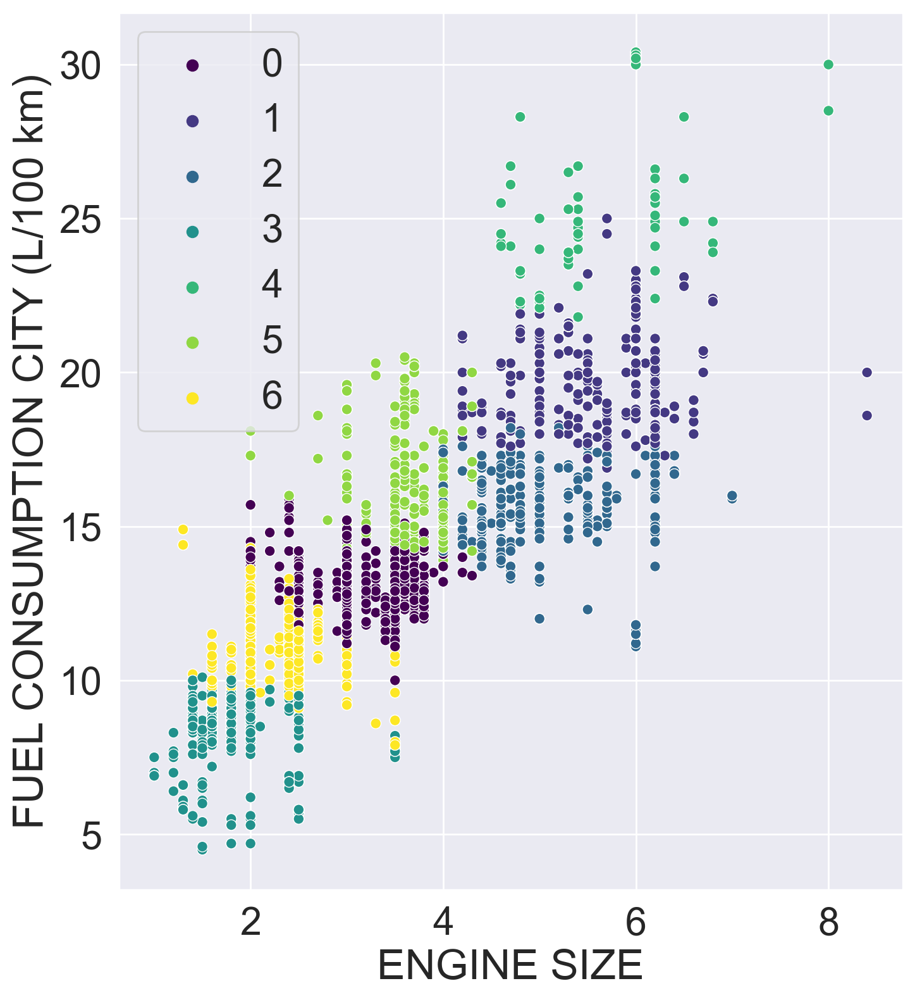

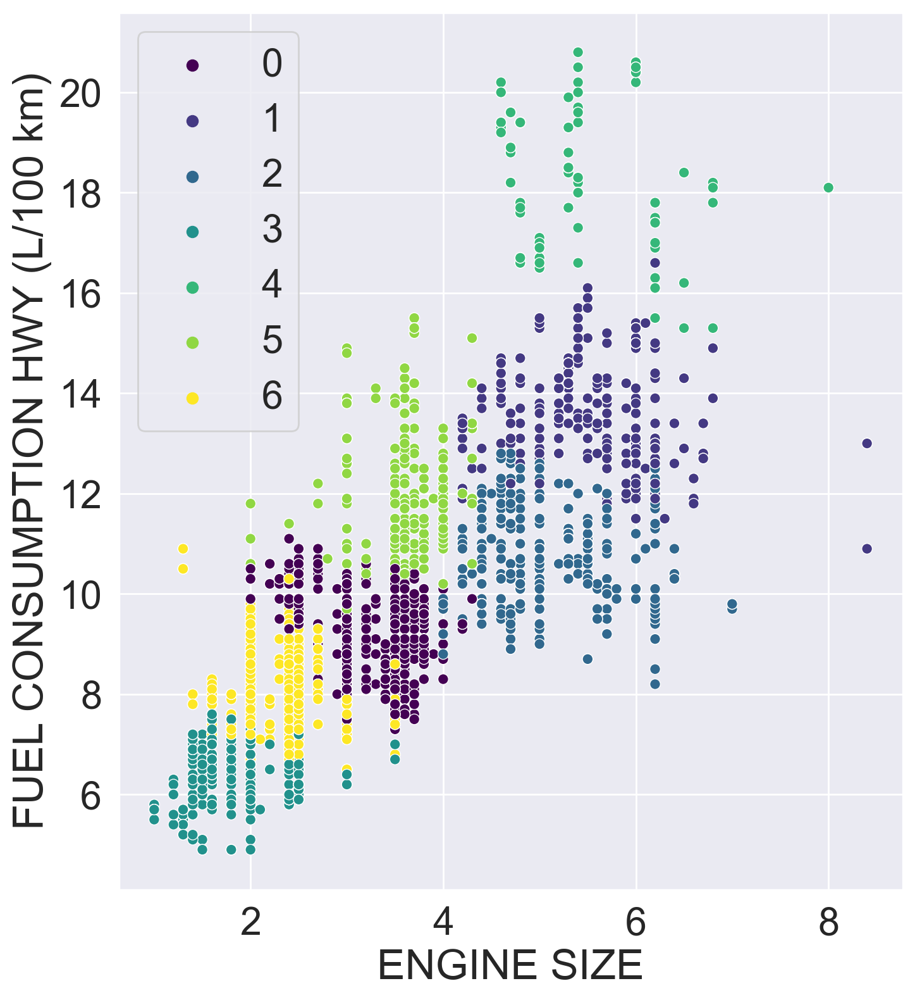

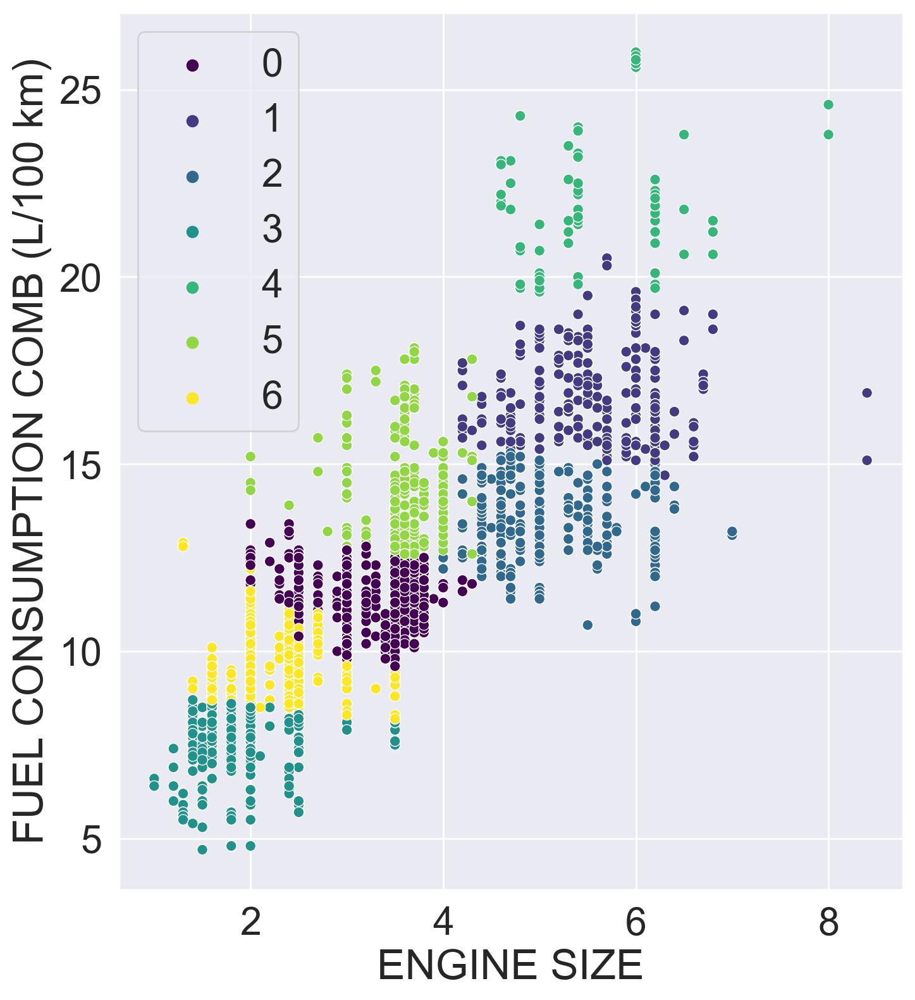

...

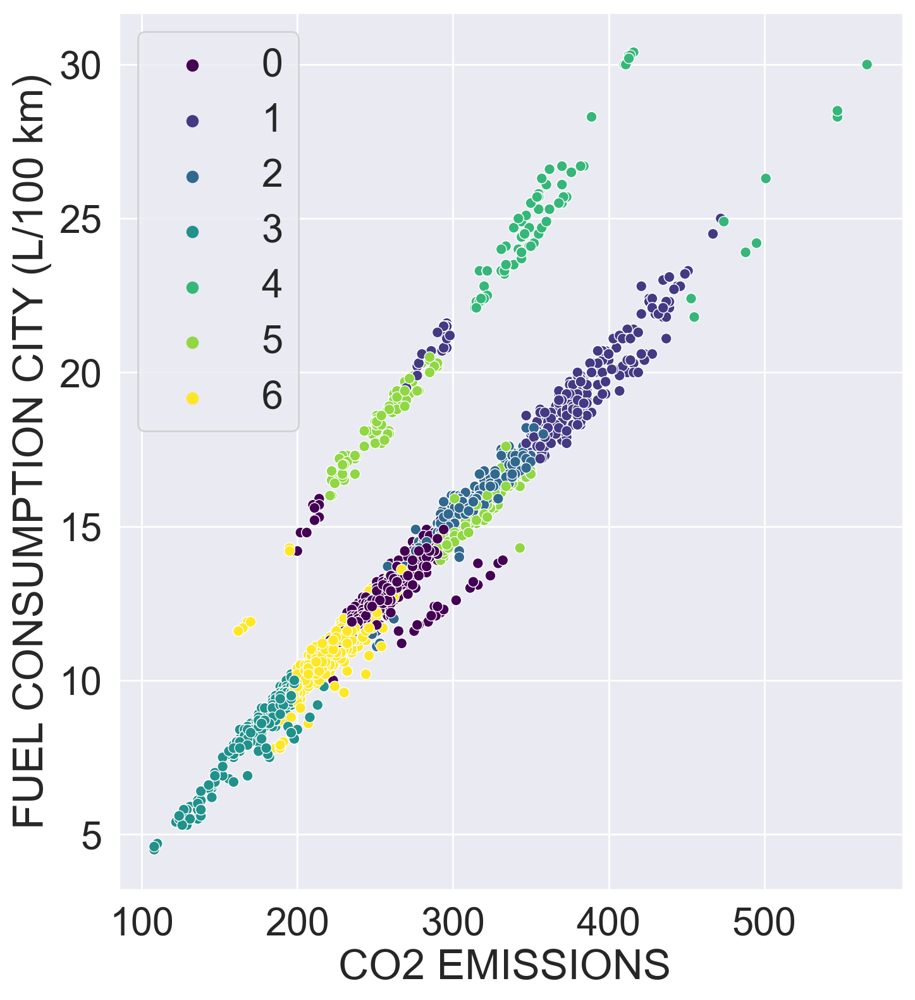

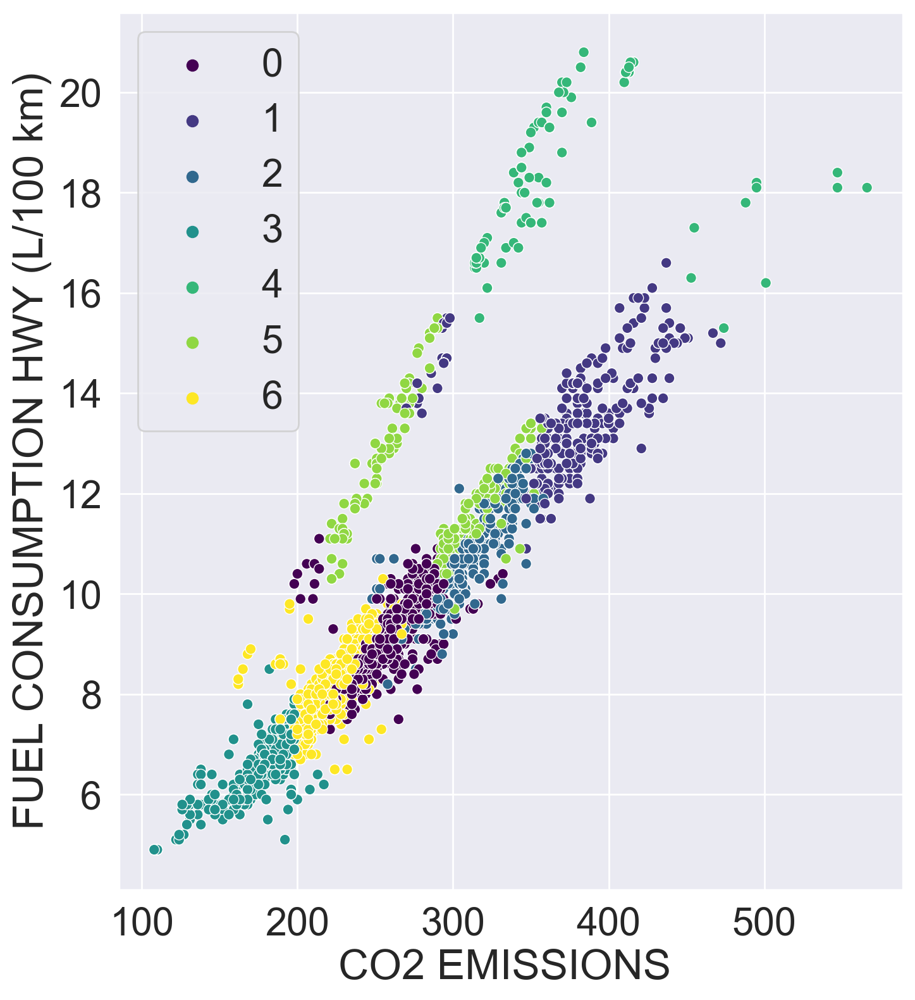

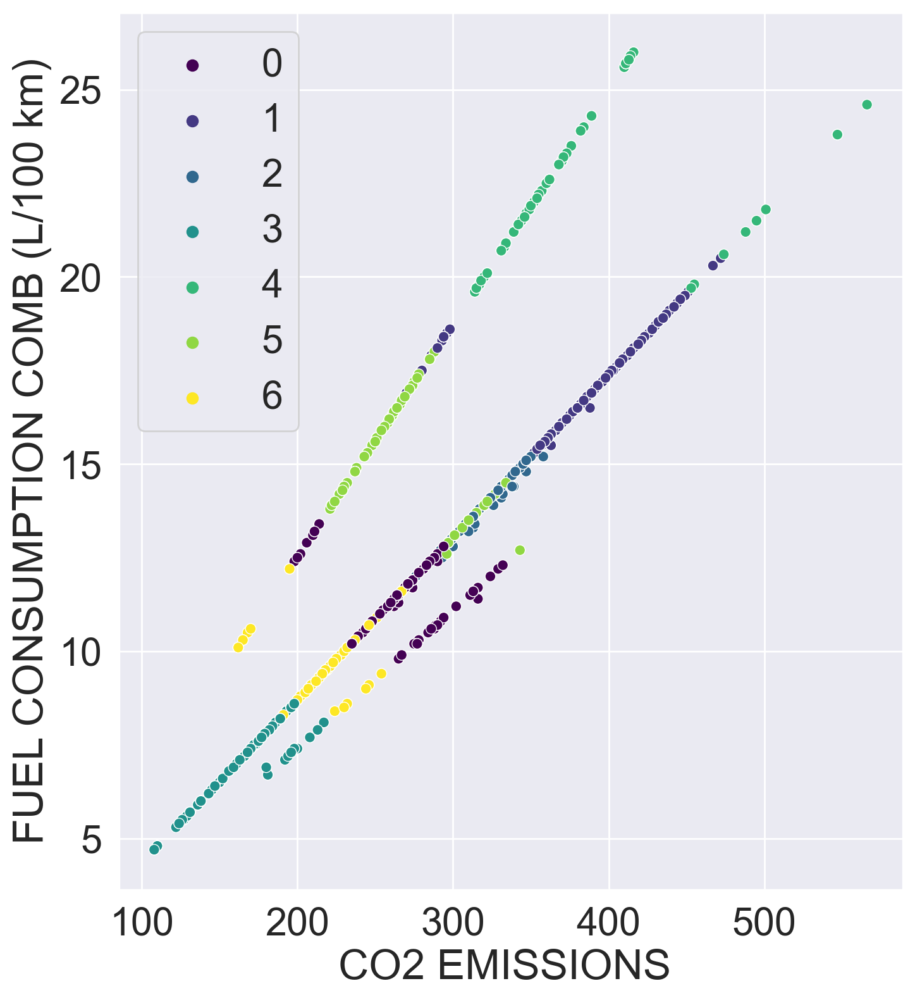

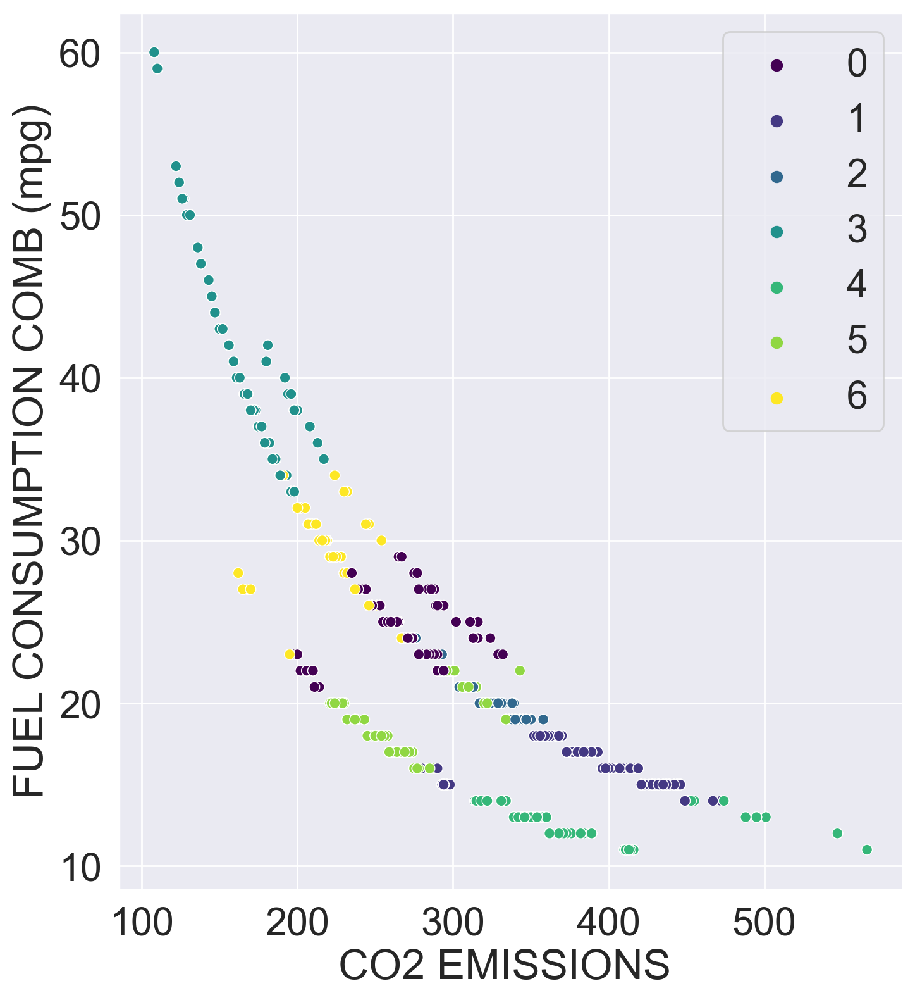

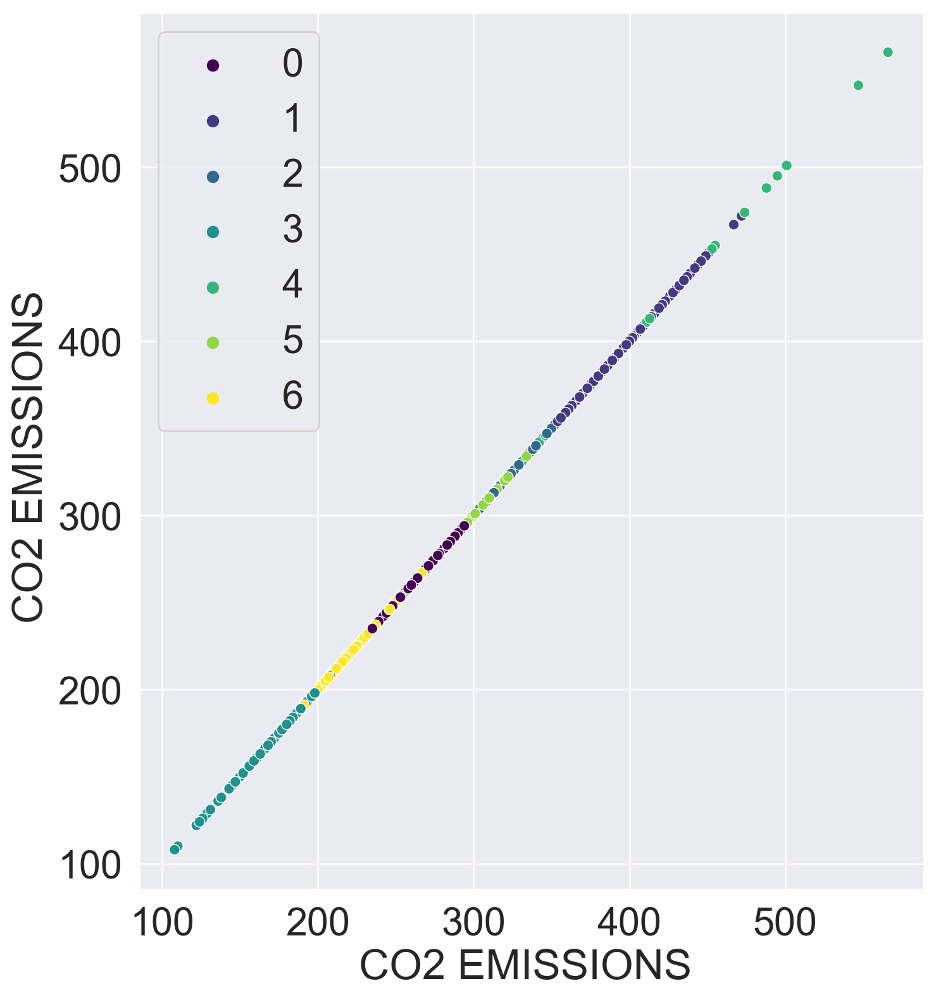

In [56]:
# plot
Numeric_data.drop('Cluster',axis=1,inplace=True)
for i in Numeric_data.columns:
    for j in Numeric_data.columns:
        plt.figure(figsize = (8,9),dpi = 200)
        sns.set(font_scale=2)
        sns.scatterplot(data = Numeric_data, x = Numeric_data[i],y = Numeric_data[j],
        hue=ClusterLabels, palette = 'viridis')
        plt.show()
        

In [57]:
# evaluation of the clustering 

In [58]:
from sklearn.metrics import davies_bouldin_score, silhouette_score

In [59]:
DBIndex=davies_bouldin_score(Scaled_df,ClusterLabels)
DBIndex

0.8714062060767905

In [60]:
SilScore=silhouette_score(Scaled_df,ClusterLabels)
SilScore


0.4108355586162229